In [72]:
from sdm.utils import set_project_wd
set_project_wd()

Current Working Directory: /Users/matthewwhittle/Data Science/shefflied-bats


In [73]:
import json
with open('config.json') as f:
    config = json.load(f)

## Load the Data

In [74]:
import pandas as pd
import geopandas as gpd

bats_raw = pd.read_excel("data/raw/bats/SYBG Database 29th November 2023 (9849) rows) GSrfa.xlsx", sheet_name="Species recordings")
bats_raw.head()

,Recorder,Date,GridReference,GridRef6Fig,GridSquare,House number/name,Address line 1,Address line 2,Address line 3,Post Code,...,Access points,Roost (Location),Notes,Species_ORG,Species_UNI,Number,Evidence,Source,Alternative date,R or Foraging
0,BCT/NE,2010-05-17 00:00:00,NZ115084,NZ115084,NZ1108,NaN,NaN,NaN,North Yorkshire,DL11 7HS,...,NaN,Y,NaN,Common pipistrelle,Common pipistrelle,11,NaN,BCT/NE Records,NaN,R
1,Giles Manners,2014-07-03 00:00:00,NZ14640021,NZ146002,NZ1400,NaN,NaN,NaN,Richmond,DL11 6BJ,...,NaN,NaN,Method of ID unknown,Pipistrelle sp.,Pipistrellus sp.,0,NaN,NaN,NaN,n
2,Natural England Volunteer Bat Roost Visitor,2013-11-28 00:00:00,NZ20291106,NZ202110,NZ2011,NaN,NaN,Richmond,North Yorkshire,DL11 7TW,...,NaN,NaN,NaN,Soprano Pipistrelle,Soprano pipistrelle,Unknown,Live bat identified in the hand,BCT/NE Records,NaN,n
3,BCT/NE,2010-08-31 00:00:00,NZ170014,NZ170014,NZ1701,NaN,NaN,NaN,North Yorkshire,DL10 4BA,...,NaN,Y,NaN,Vespertillionidae,Unidentified bat species,0,NaN,BCT/NE Records,NaN,R
4,BCT/NE,2009-05-20 00:00:00,NZ185116,NZ185116,NZ1811,NaN,NaN,NaN,North Yorkshire,DL11 7RT,...,NaN,Y,NaN,Vespertillionidae,Unidentified bat species,Unknown,NaN,BCT/NE Records,NaN,R


I want to be able to provide the tidy data back to the bat group so I'm adding a unique ID column which can be used to match the original data to the tidy data.

In [75]:
bats_raw["row_id"] = bats_raw.index

In [76]:
# Write to csv
bats_raw.to_csv("data/processed/bats_raw_id.csv", index=False)

## Select & Tidy Columns

In [77]:
# Add all columns as a json string to each row
bats_raw["source_data"] = bats_raw.apply(lambda row: row.to_json(), axis=1)

In [78]:
bats_raw.columns

Index(['Recorder', 'Date', 'GridReference', 'GridRef6Fig', 'GridSquare',
       'House number/name', 'Address line 1', 'Address line 2',
       'Address line 3', 'Post Code', 'Type', 'Structure type',
       'Roost report form', 'Access points', 'Roost (Location)', 'Notes',
       'Species_ORG', 'Species_UNI', 'Number', 'Evidence', 'Source',
       'Alternative date', 'R or Foraging', 'row_id', 'source_data'],
      dtype='object')

In [79]:
column_mappings = {"Date" : "date", "GridReference":"grid_reference", "Species_UNI":"species_raw", "R or Foraging" : "activity_type", "source_data":"source_data"}
bats = bats_raw.rename(columns=column_mappings)
columns_keep = [tidy_name for tidy_name in column_mappings.values()]
bats = bats[columns_keep]
bats.head()

,date,grid_reference,species_raw,activity_type,source_data
0,2010-05-17 00:00:00,NZ115084,Common pipistrelle,R,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr..."
1,2014-07-03 00:00:00,NZ14640021,Pipistrellus sp.,n,"{""Recorder"":""Giles Manners"",""Date"":14043456000..."
2,2013-11-28 00:00:00,NZ20291106,Soprano pipistrelle,n,"{""Recorder"":""Natural England Volunteer Bat Roo..."
3,2010-08-31 00:00:00,NZ170014,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr..."
4,2009-05-20 00:00:00,NZ185116,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr..."


## Dates

In [80]:
from dateparser import parse
import pandas as pd
bats_datetime_pd = pd.to_datetime(bats.date, errors = "coerce")
# failed datetime conversions
messy_dates = bats.date[bats_datetime_pd.isnull()]

/var/folders/vm/9ws15vws62zgnr64rdr_ls5r0000gn/T/ipykernel_93654/493547669.py:3: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  bats_datetime_pd = pd.to_datetime(bats.date, errors = "coerce")


In [81]:
messy_dates.unique()

array([nan, 'Summer 2020', 'June 2015; July 2015',
       'Between 2006 and 2012', '3/6/19 to 19/6/19', '-', '11/010/2017',
       'Sept/Oct 2018', '1st, 15th, 28th May 2021',
       'Summer 2012 and summer 2013', '30 July 0219',
       '14/9/18 to 18/9/18', '15/10/18 to 18/8/18', 'Summer 2012',
       '31/09/2015', '06-20/02/15', '06-20/03/15', 'June-July 2015',
       '27/05/15, 24/06/15, 17/06/15', '20/05/15; 08/06/15',
       'May-July 2015', 'e59', 'Unknown', 'July 2009 and July 2010',
       'Summer 1989', 'Summer 1990', 'Summer 1991', 'Summer 1992',
       'Summer 1993', 'Summer 1994', 'Summer 1995', 'Summer 1996',
       'Summer 1997', 'Summer 1998', 'Summer 1999', 'Summer 2000',
       'Summer 2001', 'Summer 2002', 'Summer 2003', 'Summer 2004',
       'Summer 2005', 'Summer 2006', 'Summer 2007',
       '16th June, 13th July, 18th August, 7th September and 12th October 2021',
       '14th, 29th June and 13th July 2021'], dtype=object)

In [82]:
parsed_dates_recent = {
    "nan": None,
    "Summer 2020": "2020-08-31",  # End of summer
    "June 2015; July 2015": "2015-07-31",  # End of July
    "Between 2006 and 2012": "2012-12-31",  # End of 2012
    "3/6/19 to 19/6/19": "2019-06-19",  # End date of the range
    "-": None,
    "11/010/2017": "2017-10-11",  # Invalid date
    "Sept/Oct 2018": "2018-10-31",  # End of October
    "1st, 15th, 28th May 2021": "2021-05-28",  # Most recent date
    "Summer 2012 and summer 2013": "2013-08-31",  # End of summer 2013
    "30 July 0219": "2019-07-30",  # Likely a typo, unclear year
    "14/9/18 to 18/9/18": "2018-09-18",  # End date of the range
    "15/10/18 to 18/8/18": "2018-10-15",  # Most recent date (assuming typo in range)
    "31/09/2015": "2015-09-30",  # Invalid date (September has 30 days)
    "06-20/02/15": "2015-02-20",  # End of the range
    "06-20/03/15": "2015-03-20",  # End of the range
    "June-July 2015": "2015-07-31",  # End of July
    "27/05/15, 24/06/15, 17/06/15": "2015-06-24",  # Most recent date
    "20/05/15; 08/06/15": "2015-06-08",  # Most recent date
    "May-July 2015": "2015-07-31",  # End of July
    "e59": None,  # Not a recognizable date
    "Unknown": None,
    "July 2009 and July 2010": "2010-07-31",  # End of July 2010
    # Subsequent entries for each year's summer end date
    "Summer 1989": "1989-08-31",
    "Summer 1990": "1990-08-31",
    "Summer 1991": "1991-08-31",
    "Summer 1992": "1992-08-31",
    "Summer 1993": "1993-08-31",
    "Summer 1994": "1994-08-31",
    "Summer 1995": "1995-08-31",
    "Summer 1996": "1996-08-31",
    "Summer 1997": "1997-08-31",
    "Summer 1998": "1998-08-31",
    "Summer 1999": "1999-08-31",
    "Summer 2000": "2000-08-31",
    "Summer 2001": "2001-08-31",
    "Summer 2002": "2002-08-31",
    "Summer 2003": "2003-08-31",
    "Summer 2004": "2004-08-31",
    "Summer 2005": "2005-08-31",
    "Summer 2006": "2006-08-31",
    "Summer 2007": "2007-08-31",
    "Summer 2012": "2012-08-31",
    "16th June, 13th July, 18th August, 7th September and 12th October 2021": "2021-10-12",  # Most recent date
    "14th, 29th June and 13th July 2021": "2021-07-13",  # Most recent date
}

# Replace the parsed dates
bats["date_parsed"] = bats.date.replace(parsed_dates_recent)
# add the pandas dates
bats["date_parsed"] = pd.to_datetime(bats.date_parsed, errors = "coerce")

/var/folders/vm/9ws15vws62zgnr64rdr_ls5r0000gn/T/ipykernel_93654/519232628.py:53: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  bats["date_parsed"] = pd.to_datetime(bats.date_parsed, errors = "coerce")


In [83]:
bats[bats.date_parsed.isnull()].date.unique()

array([nan, '-', 'e59', 'Unknown'], dtype=object)

<Axes: >

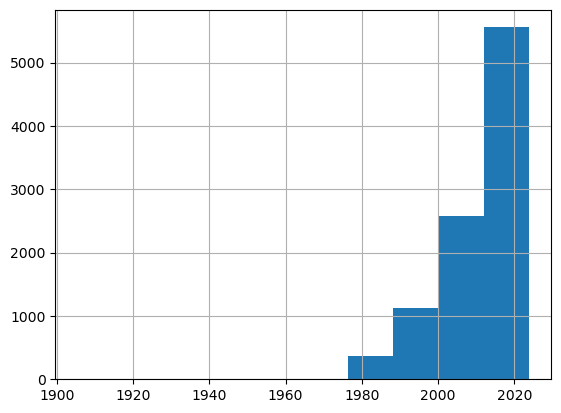

In [84]:
bats.date_parsed.hist()

In [85]:
# Tidy up the columns a bit
bats.drop(columns=["date"], inplace=True)
bats.rename(columns={"date_parsed":"date"}, inplace=True)
bats.head()

,grid_reference,species_raw,activity_type,source_data,date
0,NZ115084,Common pipistrelle,R,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr...",2010-05-17
1,NZ14640021,Pipistrellus sp.,n,"{""Recorder"":""Giles Manners"",""Date"":14043456000...",2014-07-03
2,NZ20291106,Soprano pipistrelle,n,"{""Recorder"":""Natural England Volunteer Bat Roo...",2013-11-28
3,NZ170014,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr...",2010-08-31
4,NZ185116,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr...",2009-05-20


## Species Tidying

In [86]:
bats.species_raw.value_counts().to_dict()

{'Common pipistrelle': 3350,
 'Pipistrellus sp.': 1398,
 'Unidentified bat species': 1389,
 "Daubenton's bat": 710,
 'Soprano pipistrelle': 526,
 'Brown long-eared bat': 519,
 'Noctule': 467,
 "Natterer's bat": 411,
 'Myotis sp.': 277,
 "Whiskered/Brandt's/Alcathoe bat": 168,
 'Whiskered bat': 158,
 "Leisler's bat": 157,
 'Common Pipistrelle': 74,
 'Nyctalus sp.': 46,
 'common pipistrelle': 46,
 'Absent': 37,
 "Brandt's bat": 21,
 "Noctule/Leisler's bat/Serotine": 19,
 'soprano pipistrelle': 16,
 'noctule': 15,
 "Daubenton's Bat": 10,
 'brown long-eared bat': 10,
 'Soprano Pipistrelle': 8,
 "Leisler's Bat": 5,
 "Brandt's Bat": 3,
 "Nathusius' pipistrelle": 3,
 'Serotine': 3,
 'Whiskered Bat': 2}

I've prepared a json file mapping the species names in the dataset to their correct common and latin names + genus. This will help us tidy the species column and group the bats appropriately in modelling.

In [87]:
import json
with open("data/processed/species-mappings.json", "r") as f:
    species_mappings_dict = json.load(f)

# Convert to a dictionary 
species_mappings_df = pd.DataFrame.from_dict(species_mappings_dict, orient='index')
species_mappings_df.reset_index(inplace=True, names = ["species_raw"])

species_mappings_df.head()

,species_raw,latin_name,common_name,genus
0,Common pipistrelle,Pipistrellus pipistrellus,Common Pipistrelle,Pipistrellus
1,Unidentified bat species,Unknown,Unidentified Bat,Unknown
2,Pipistrellus sp.,Pipistrellus sp.,Unidentified Pipistrelle,Pipistrellus
3,Daubenton's bat,Myotis daubentonii,Daubenton's Bat,Myotis
4,Soprano pipistrelle,Pipistrellus pygmaeus,Soprano Pipistrelle,Pipistrellus


In [88]:
bats = bats.merge(species_mappings_df, on="species_raw", how="left")
bats.head()

,grid_reference,species_raw,activity_type,source_data,date,latin_name,common_name,genus
0,NZ115084,Common pipistrelle,R,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr...",2010-05-17,Pipistrellus pipistrellus,Common Pipistrelle,Pipistrellus
1,NZ14640021,Pipistrellus sp.,n,"{""Recorder"":""Giles Manners"",""Date"":14043456000...",2014-07-03,Pipistrellus sp.,Unidentified Pipistrelle,Pipistrellus
2,NZ20291106,Soprano pipistrelle,n,"{""Recorder"":""Natural England Volunteer Bat Roo...",2013-11-28,Pipistrellus pygmaeus,Soprano Pipistrelle,Pipistrellus
3,NZ170014,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr...",2010-08-31,Unknown,Unidentified Bat,Unknown
4,NZ185116,Unidentified bat species,R,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr...",2009-05-20,Unknown,Unidentified Bat,Unknown


In [89]:
bats.dtypes

grid_reference            object
species_raw               object
activity_type             object
source_data               object
date              datetime64[ns]
latin_name                object
common_name               object
genus                     object
dtype: object

# Activity Type

In [90]:
print(bats.activity_type.value_counts().to_json())

activity_categories = {
    "f": "Foraging",
    "n": "Unknown",
    "N": "Unknown",
    "r": "Roost",
    "R": "Roost",
    "F": "Foraging",
}
bats["activity_type"] = bats.activity_type.map(activity_categories)
bats.head()

{"f":3991,"n":3012,"r":1803,"R":1016,"F":25,"N":1}


,grid_reference,species_raw,activity_type,source_data,date,latin_name,common_name,genus
0,NZ115084,Common pipistrelle,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr...",2010-05-17,Pipistrellus pipistrellus,Common Pipistrelle,Pipistrellus
1,NZ14640021,Pipistrellus sp.,Unknown,"{""Recorder"":""Giles Manners"",""Date"":14043456000...",2014-07-03,Pipistrellus sp.,Unidentified Pipistrelle,Pipistrellus
2,NZ20291106,Soprano pipistrelle,Unknown,"{""Recorder"":""Natural England Volunteer Bat Roo...",2013-11-28,Pipistrellus pygmaeus,Soprano Pipistrelle,Pipistrellus
3,NZ170014,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr...",2010-08-31,Unknown,Unidentified Bat,Unknown
4,NZ185116,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr...",2009-05-20,Unknown,Unidentified Bat,Unknown


## Spatial Info

The grid references are in an alpha numeric format so I need to convert them in to EPSG:27700 coordinates. 

In [91]:
bats.grid_reference.value_counts()

SE328021        283
SE345034        224
SE534005         92
SE3302           57
SE350029         55
               ... 
SK2458397753      1
SK2458597719      1
SK2458697701      1
SK2458697743      1
SK44059881        1
Name: grid_reference, Length: 5399, dtype: int64

In [92]:
# First drop rows with a missing grid reference
missing_ref = bats.grid_reference.isna()
bats = bats[~missing_ref]
print(f"Dropped {missing_ref.sum()} rows with missing grid references")

Dropped 50 rows with missing grid references


In [93]:
# Remove any leading or trailing whitespace
bats.grid_reference = bats.grid_reference.str.strip()

In [94]:
# There are some poorly formatted grid references, so I'll check for them using a regex then fix / remove them
import re
def check_grid_reference(grid_ref):
    if pd.isna(grid_ref) or not isinstance(grid_ref, str):
        return False
    pattern = r"^[A-Za-z]{2} ?\d{1,5} ?\d{1,5}$"
    return bool(re.match(pattern, grid_ref))

bats["grid_reference_valid"] = bats.grid_reference.apply(check_grid_reference)
bats[bats.grid_reference_valid == False].grid_reference.to_dict()

{44: 'S 4811699289',
 957: 'SK401964toSK393980',
 8080: 'SK401964toSK393980',
 8155: 'SK41894978784'}

I've manually reviewed this subset of grid references and infered the correct locations from the context in the spreadsheet.

In [95]:
grid_reference_mappings = {
    "S 4811699289": "SK4811699289", # Checked address in grid ref finder
    "SK401964toSK393980": "SK396970", # Taken estimated middle point
    "SK401964toSK393980": "SK397972", # Taken estimated middle point
    "SK41894978784": "SK4189478784", # Checked post code in grid ref finder
}

# Replace the invalid grid references
bats.grid_reference.replace(grid_reference_mappings, inplace=True)


### Use the BNG package to convert

[GitHub](https://github.com/volcan01010/bng)

This gives the south west corner of the grid square. I will add half the resolution to get the centre of the grid square.

In [96]:
import os
import bng

def grid_ref_to_osgb36(grid_ref):
    if pd.isna(grid_ref):
        return (None, None)
    try:
        osgb36 = bng.to_osgb36(grid_ref)
        return osgb36
    except:
        return (None, None)

def calculate_accuracy(grid_ref):
    if pd.isna(grid_ref):
        return None
    num_digits = len(grid_ref) - 2
    accuracy = 10 ** (5 - num_digits // 2)
    return accuracy

xy = [grid_ref_to_osgb36(g) for g in bats.grid_reference]
x, y = zip(*xy)
bats["x"] = x
bats["y"] = y
bats["accuracy"] = bats.grid_reference.apply(calculate_accuracy)
# Move the x and y to middle of the squares
bats["x"] = bats.x + bats.accuracy / 2
bats["y"] = bats.y + bats.accuracy / 2
# Drop any rows with missing x or y
bats = bats[~bats.x.isna() & ~bats.y.isna()]

bats[["grid_reference", "x", "y", "accuracy"]].head()

,grid_reference,x,y,accuracy
0,NZ115084,411550.0,508450.0,100.0
1,NZ14640021,414645.0,500215.0,10.0
2,NZ20291106,420295.0,511065.0,10.0
3,NZ170014,417050.0,501450.0,100.0
4,NZ185116,418550.0,511650.0,100.0


In [97]:
# convert to a geodataframe
bats_gdf = gpd.GeoDataFrame(bats, geometry=gpd.points_from_xy(bats.x, bats.y), crs = "EPSG:27700")
bats_gdf.head()

,grid_reference,species_raw,activity_type,source_data,date,latin_name,common_name,genus,grid_reference_valid,x,y,accuracy,geometry
0,NZ115084,Common pipistrelle,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr...",2010-05-17,Pipistrellus pipistrellus,Common Pipistrelle,Pipistrellus,True,411550.0,508450.0,100.0,POINT (411550.000 508450.000)
1,NZ14640021,Pipistrellus sp.,Unknown,"{""Recorder"":""Giles Manners"",""Date"":14043456000...",2014-07-03,Pipistrellus sp.,Unidentified Pipistrelle,Pipistrellus,True,414645.0,500215.0,10.0,POINT (414645.000 500215.000)
2,NZ20291106,Soprano pipistrelle,Unknown,"{""Recorder"":""Natural England Volunteer Bat Roo...",2013-11-28,Pipistrellus pygmaeus,Soprano Pipistrelle,Pipistrellus,True,420295.0,511065.0,10.0,POINT (420295.000 511065.000)
3,NZ170014,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr...",2010-08-31,Unknown,Unidentified Bat,Unknown,True,417050.0,501450.0,100.0,POINT (417050.000 501450.000)
4,NZ185116,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr...",2009-05-20,Unknown,Unidentified Bat,Unknown,True,418550.0,511650.0,100.0,POINT (418550.000 511650.000)


In [98]:
from shapely.geometry import box, Point

def generate_grid_square(x, y, resolution:float):
    """Generate a grid square around a point with a given accuracy"""
    if pd.isna(x) or pd.isna(y):
        return None
    box_geom = box(x - resolution / 2, y - resolution / 2, x + resolution / 2, y + resolution / 2)
    return box_geom

bats_gdf["grid_square_geom"] = bats_gdf.apply(lambda row: generate_grid_square(row.x, row.y, row.accuracy), axis=1)
bats_gdf.head()

,grid_reference,species_raw,activity_type,source_data,date,latin_name,common_name,genus,grid_reference_valid,x,y,accuracy,geometry,grid_square_geom
0,NZ115084,Common pipistrelle,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1274054400000,""Gr...",2010-05-17,Pipistrellus pipistrellus,Common Pipistrelle,Pipistrellus,True,411550.0,508450.0,100.0,POINT (411550.000 508450.000),"POLYGON ((411600.000 508400.000, 411600.000 50..."
1,NZ14640021,Pipistrellus sp.,Unknown,"{""Recorder"":""Giles Manners"",""Date"":14043456000...",2014-07-03,Pipistrellus sp.,Unidentified Pipistrelle,Pipistrellus,True,414645.0,500215.0,10.0,POINT (414645.000 500215.000),"POLYGON ((414650.000 500210.000, 414650.000 50..."
2,NZ20291106,Soprano pipistrelle,Unknown,"{""Recorder"":""Natural England Volunteer Bat Roo...",2013-11-28,Pipistrellus pygmaeus,Soprano Pipistrelle,Pipistrellus,True,420295.0,511065.0,10.0,POINT (420295.000 511065.000),"POLYGON ((420300.000 511060.000, 420300.000 51..."
3,NZ170014,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1283212800000,""Gr...",2010-08-31,Unknown,Unidentified Bat,Unknown,True,417050.0,501450.0,100.0,POINT (417050.000 501450.000),"POLYGON ((417100.000 501400.000, 417100.000 50..."
4,NZ185116,Unidentified bat species,Roost,"{""Recorder"":""BCT\/NE"",""Date"":1242777600000,""Gr...",2009-05-20,Unknown,Unidentified Bat,Unknown,True,418550.0,511650.0,100.0,POINT (418550.000 511650.000),"POLYGON ((418600.000 511600.000, 418600.000 51..."


The modelling will be at a 100m resolution so I will filter out any records that are less accurate than this resolution.

In [99]:
bats.accuracy.value_counts().sort_index()

1.0       3901
10.0       526
100.0     4911
1000.0     421
Name: accuracy, dtype: int64

In [100]:
bats_gdf.drop(columns=["grid_reference_valid"], inplace=True)
bats_gdf = bats_gdf.astype(
    {
        "grid_reference": "string",
        "species_raw": "string",
        "activity_type": "string",
        "latin_name": "string",
        "genus": "string",
        "date": "string",
    }
)

# Visualise the data

In [101]:
boundary = gpd.read_file("data/processed/boundary.geojson")

There are a lot of records outside south yorkshire. 

/Users/matthewwhittle/opt/miniconda3/envs/bats/lib/python3.11/site-packages/pygeos/constructive.py:175: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


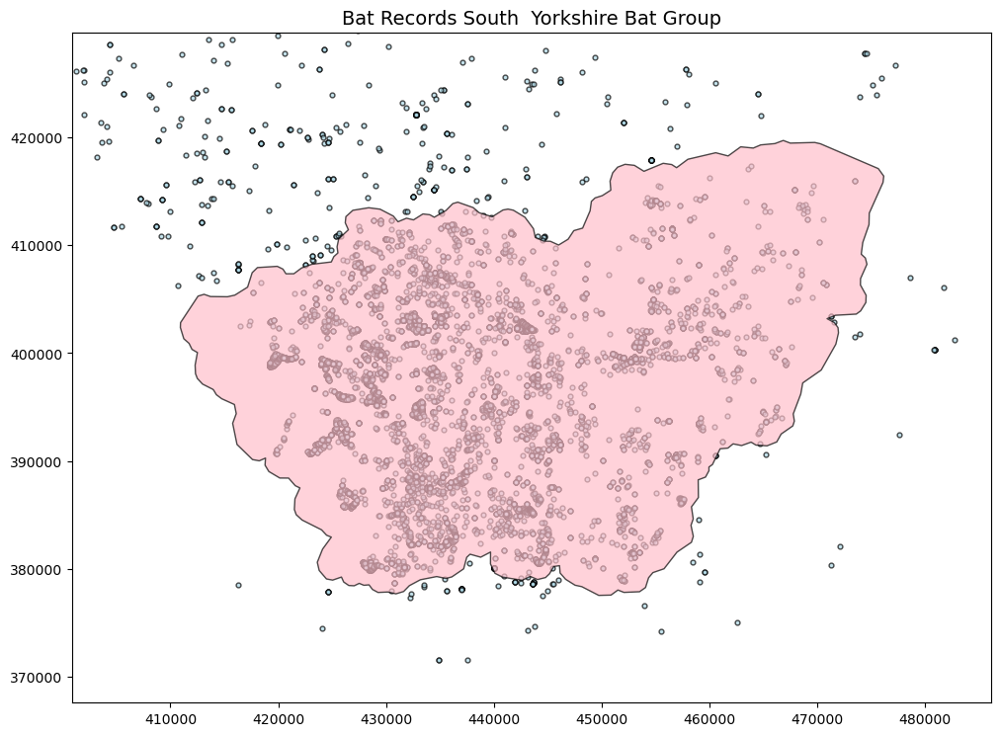

In [102]:
from fiona import bounds
import matplotlib.pyplot as plt
from numpy import size

fig, ax = plt.subplots(figsize=(12, 12))
# marker size
bats_gdf.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.7, markersize=12)
# set the x and y axis limits
bounds_lim = boundary.buffer(10000).total_bounds
ax.set_xlim(bounds_lim[0], bounds_lim[2])
ax.set_ylim(bounds_lim[1], bounds_lim[3])
# Add the boundary as a pink outline
boundary.plot(ax=ax, color="pink", edgecolor="black", alpha=0.7)
# Add title
ax.set_title("Bat Records South  Yorkshire Bat Group", fontsize=14)
plt.show()

In [103]:
bats_gdf.explore()

# Write to File

In [104]:
# write to parquet
bats_gdf.to_parquet("data/processed/sybg-bats.parquet")
# write to geojson
bats_gdf["grid_square_geom"] = bats_gdf.grid_square_geom.to_wkt()
bats_gdf.to_file("data/processed/sybg-bats.geojson", driver="GeoJSON")

## Write a file for the bat group

In [105]:
# Write an expanded shapefile for the bat group
# Convert the source data json column of key value pairs to individual columns
source_data = bats_gdf.source_data.apply(json.loads).apply(pd.Series)

bats_gdf_full = bats_gdf.join(source_data)
bats_gdf_full.drop(columns=["source_data"], inplace=True)

bats_gdf_full.to_file("data/processed/South Yorkshire Bat Group Spatial Records.geojson", driver="GeoJSON")
